In [1]:
import keras
import tensorflow as tf

In [2]:
import os
from osgeo import gdal
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from glob import glob
from keras_unet.models import custom_unet, satellite_unet
from keras_unet.metrics import iou, iou_thresholded
from keras_unet.losses import jaccard_distance
from keras_unet.utils import plot_segm_history

-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------


In [3]:
# training data
base_dir = Path(r'e:\Google Drive\research\projects\utica')
mask_dir = base_dir.joinpath('mask')
train_image_dir = mask_dir.joinpath('u_train_reproject')
trees_mask_dir = mask_dir.joinpath('trees')
building_mask_dir = mask_dir.joinpath('building')
pavement_mask_dir = mask_dir.joinpath('pavement')

In [4]:
I, N, M = 60, 256, 256

In [5]:
os.listdir(mask_dir)

['building', 'desktop.ini', 'pavement', 'trees', 'u_train_reproject']

In [6]:
def make_path(img_dir, prefix, number):
    return os.path.join(img_dir, f"{prefix}_{number}.tif")

In [7]:
def img_number(fpath: str) -> int:
    return int(os.path.splitext(os.path.split(fpath)[1])[0].split('_')[-1])

In [8]:
def load_image(path: str) -> np.ndarray:
    ds = gdal.Open(path, gdal.GA_ReadOnly)
    return ds.GetRasterBand(1).ReadAsArray()[6:-7,6:-6]

def load_image_no_trim(path: str) -> np.ndarray:
    ds = gdal.Open(path, gdal.GA_ReadOnly)
    return ds.GetRasterBand(1).ReadAsArray()

In [9]:
def sorted_paths(img_dir: Path):
    return sorted(glob(img_dir.joinpath('*.tif').as_posix()), key=img_number)

In [10]:
def load_stack_safely(shape, dtype, img_dir, prefix):
    """
    Load a stack of images from disk into an ndarray.

    Performs the load potentially several times, to ensure that values
    stabilize. Google seems to be...tricky...
    """
    last_sum = 0
    while True:
        stack = np.zeros(shape=shape, dtype=dtype)
        for i in range(shape[0]):
            image_path = make_path(img_dir, prefix, i + 1)
            if not os.path.isfile(image_path):
                print("skipping", image_path)
                continue
            stack[i, :, :] = load_image(image_path)
        if stack.sum() == last_sum:
            break
        last_sum = stack.sum()
    return stack

In [11]:
def load_stack_nt(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape=shape, dtype=dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        stack[i, :, :] = load_image_no_trim(image_path)
    return stack

In [12]:
train_images = load_stack_safely((I, N, M), np.float32, train_image_dir, "wgs_train")
tree_masks = load_stack_safely((I, N, M), np.int8, trees_mask_dir, "tree_mask")
building_masks = load_stack_safely((I, N, M), np.int8, building_mask_dir, "building_mask")
pavement_masks = load_stack_safely((I, N, M), np.int8, pavement_mask_dir, "pavement_mask")

skipping e:\Google Drive\research\projects\utica\mask\building\building_mask_8.tif
skipping e:\Google Drive\research\projects\utica\mask\building\building_mask_19.tif
skipping e:\Google Drive\research\projects\utica\mask\building\building_mask_27.tif
skipping e:\Google Drive\research\projects\utica\mask\building\building_mask_31.tif
skipping e:\Google Drive\research\projects\utica\mask\building\building_mask_34.tif
skipping e:\Google Drive\research\projects\utica\mask\building\building_mask_51.tif
skipping e:\Google Drive\research\projects\utica\mask\building\building_mask_8.tif
skipping e:\Google Drive\research\projects\utica\mask\building\building_mask_19.tif
skipping e:\Google Drive\research\projects\utica\mask\building\building_mask_27.tif
skipping e:\Google Drive\research\projects\utica\mask\building\building_mask_31.tif
skipping e:\Google Drive\research\projects\utica\mask\building\building_mask_34.tif
skipping e:\Google Drive\research\projects\utica\mask\building\building_mask_5

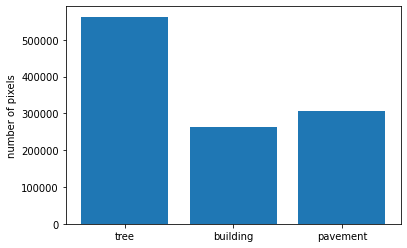

In [13]:
fig, ax = plt.subplots()
ax.bar(range(3), [tree_masks.sum(), building_masks.sum(), pavement_masks.sum()])
ax.set_xticks((0, 1, 2))
ax.set_xticklabels(('tree', 'building', 'pavement'))
plt.ylabel('number of pixels')
plt.show()

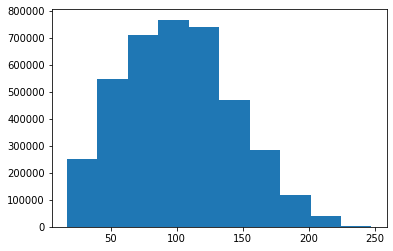

In [14]:
plt.hist(train_images.flatten())
plt.show()

In [15]:
model = satellite_unet(
    (N, M, 1),
    3,
    # dropout_type="spatial"
)

In [16]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(), 
    #optimizer=SGD(lr=0.01, momentum=0.99),
    loss='binary_crossentropy',
    #loss=jaccard_distance,
    metrics=[iou, iou_thresholded],
    
)

In [17]:
Y = np.zeros(shape=(I, N, M, 3), dtype=np.int8)
Y[:, :, :, 0] = tree_masks
Y[:, :, :, 1] = building_masks
Y[:, :, :, 2] = pavement_masks

In [18]:
Y.shape, tree_masks.shape

((60, 256, 256, 3), (60, 256, 256))

In [19]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  640         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [20]:
checkpoint_path = Path(r'e:\Google Drive\research\projects\utica\model_out\1950s')
checkpoint_dir = os.path.dirname(checkpoint_path)

In [21]:
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

In [22]:
history = model.fit(
    train_images.reshape(I, N, M, 1),
    Y,
    epochs=80,
          callbacks=[cp_callback])

Epoch 1/80
2/2 [==============================] - ETA: 0s - loss: 0.7368 - iou: 0.1055 - iou_thresholded: 0.1235 
Epoch 00001: saving model to e:\Google Drive\research\projects\utica\model_out\1950s
2/2 [==============================] - 31s 14s/step - loss: 0.7368 - iou: 0.1055 - iou_thresholded: 0.1235
Epoch 2/80
2/2 [==============================] - ETA: 0s - loss: 0.4181 - iou: 0.1143 - iou_thresholded: 0.1466 
Epoch 00002: saving model to e:\Google Drive\research\projects\utica\model_out\1950s
2/2 [==============================] - 29s 14s/step - loss: 0.4181 - iou: 0.1143 - iou_thresholded: 0.1466
Epoch 3/80
2/2 [==============================] - ETA: 0s - loss: 0.2968 - iou: 0.1152 - iou_thresholded: 0.0559 
Epoch 00003: saving model to e:\Google Drive\research\projects\utica\model_out\1950s
2/2 [==============================] - 29s 14s/step - loss: 0.2968 - iou: 0.1152 - iou_thresholded: 0.0559
Epoch 4/80
2/2 [==============================] - ETA: 0s - loss: 0.2711 - iou: 0.

Epoch 28/80
2/2 [==============================] - ETA: 0s - loss: 0.1562 - iou: 0.3558 - iou_thresholded: 0.4672 
Epoch 00028: saving model to e:\Google Drive\research\projects\utica\model_out\1950s
2/2 [==============================] - 30s 14s/step - loss: 0.1562 - iou: 0.3558 - iou_thresholded: 0.4672
Epoch 29/80
2/2 [==============================] - ETA: 0s - loss: 0.1534 - iou: 0.3857 - iou_thresholded: 0.4949 
Epoch 00029: saving model to e:\Google Drive\research\projects\utica\model_out\1950s
2/2 [==============================] - 29s 14s/step - loss: 0.1534 - iou: 0.3857 - iou_thresholded: 0.4949
Epoch 30/80
2/2 [==============================] - ETA: 0s - loss: 0.1469 - iou: 0.3898 - iou_thresholded: 0.4899 
Epoch 00030: saving model to e:\Google Drive\research\projects\utica\model_out\1950s
2/2 [==============================] - 30s 14s/step - loss: 0.1469 - iou: 0.3898 - iou_thresholded: 0.4899
Epoch 31/80
2/2 [==============================] - ETA: 0s - loss: 0.1378 - iou

Epoch 55/80
2/2 [==============================] - ETA: 0s - loss: 0.0619 - iou: 0.6798 - iou_thresholded: 0.7736 
Epoch 00055: saving model to e:\Google Drive\research\projects\utica\model_out\1950s
2/2 [==============================] - 31s 15s/step - loss: 0.0619 - iou: 0.6798 - iou_thresholded: 0.7736
Epoch 56/80
2/2 [==============================] - ETA: 0s - loss: 0.0629 - iou: 0.6728 - iou_thresholded: 0.7641 
Epoch 00056: saving model to e:\Google Drive\research\projects\utica\model_out\1950s
2/2 [==============================] - 30s 14s/step - loss: 0.0629 - iou: 0.6728 - iou_thresholded: 0.7641
Epoch 57/80
2/2 [==============================] - ETA: 0s - loss: 0.0618 - iou: 0.6765 - iou_thresholded: 0.7657 
Epoch 00057: saving model to e:\Google Drive\research\projects\utica\model_out\1950s
2/2 [==============================] - 30s 14s/step - loss: 0.0618 - iou: 0.6765 - iou_thresholded: 0.7657
Epoch 58/80
2/2 [==============================] - ETA: 0s - loss: 0.0605 - iou

In [76]:
modelsave_path = Path(r'e:\Google Drive\research\projects\utica\model_out\1950_model\saved_model50')

In [77]:
modelsave_path

WindowsPath('e:/Google Drive/research/projects/utica/model_out/1950_model/saved_model50')

In [78]:
model.save(modelsave_path)

INFO:tensorflow:Assets written to: e:\Google Drive\research\projects\utica\model_out\1950_model\saved_model50\assets


In [83]:
Y_pred = model.predict(train_images.reshape(I, N, M, 1))

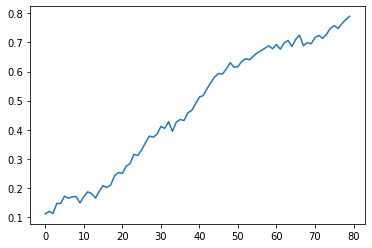

In [84]:
plt.plot(history.history['iou'])

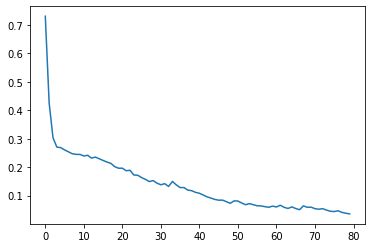

In [85]:
plt.plot(history.history['loss'])

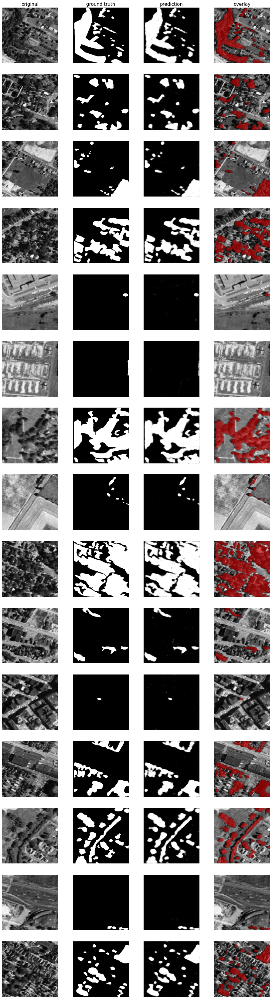

In [86]:
from keras_unet.utils import plot_imgs

plot_imgs(
    org_imgs=train_images.reshape(I, N, M, 1), 
    mask_imgs=Y[:, :, :, 0], 
    pred_imgs=Y_pred[:, :, :, 0], 
    nm_img_to_plot=15
  )

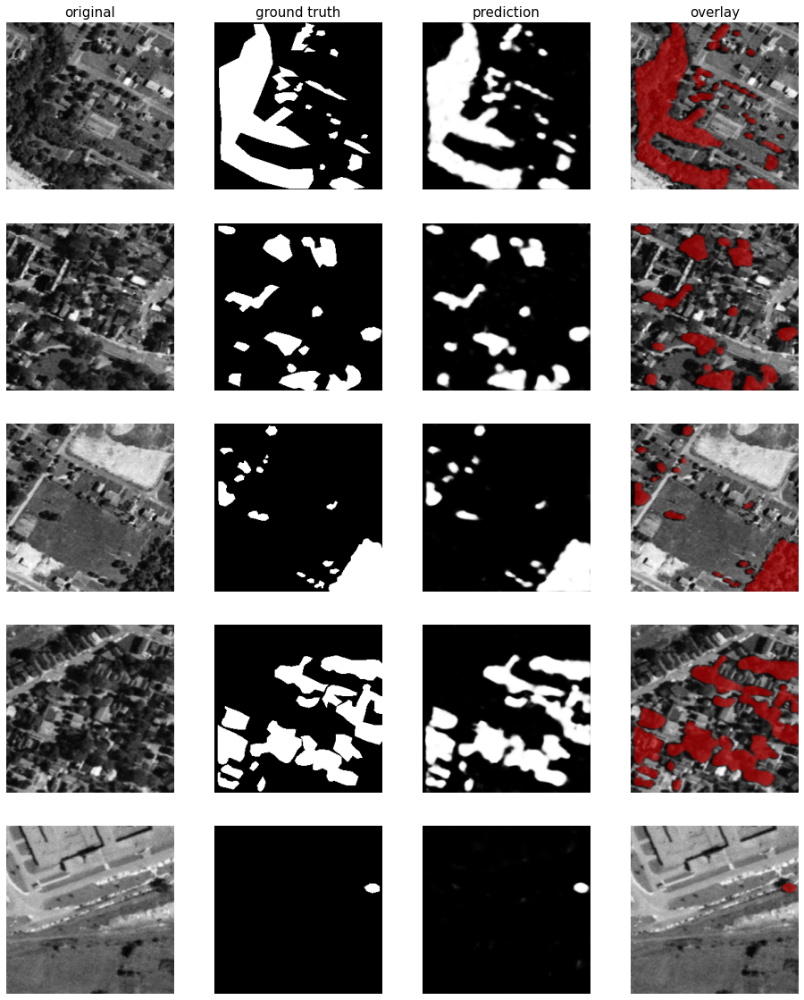

In [87]:
from keras_unet.utils import plot_imgs

plot_imgs(
    org_imgs=train_images.reshape(I, N, M, 1), 
    mask_imgs=Y[:, :, :, 0], 
    pred_imgs=Y_pred_new[:, :, :, 0], 
    nm_img_to_plot=5
  )

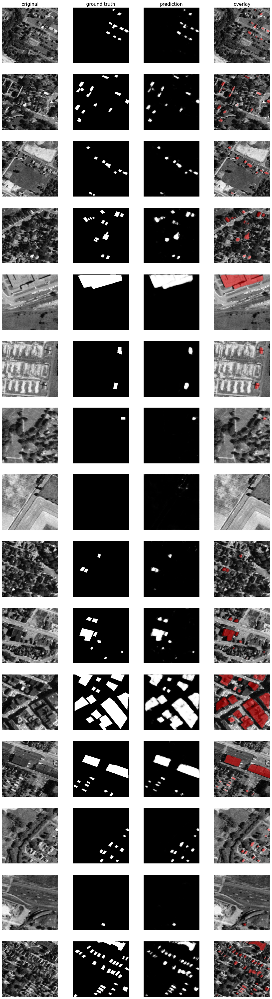

In [88]:
from keras_unet.utils import plot_imgs

plot_imgs(
    org_imgs=train_images.reshape(I, N, M, 1), 
    mask_imgs=Y[:, :, :, 1], 
    pred_imgs=Y_pred[:, :, :, 1], 
    nm_img_to_plot=15
  )

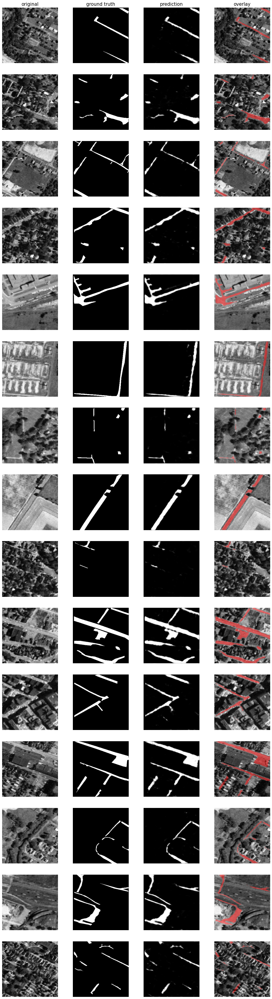

In [89]:
from keras_unet.utils import plot_imgs

plot_imgs(
    org_imgs=train_images.reshape(I, N, M, 1), 
    mask_imgs=Y[:, :, :, 2], 
    pred_imgs=Y_pred[:, :, :, 2], 
    nm_img_to_plot=15
  )

In [11]:
# validation data
base_dir = Path(r'e:\Google Drive\research\projects\utica')
mask_dirV = base_dir.joinpath('mask_50s_valid')
train_image_dirV = mask_dirV.joinpath('u_valid_reproject')
trees_mask_dirV = mask_dirV.joinpath('trees')
building_mask_dirV = mask_dirV.joinpath('building')
pavement_mask_dirV = mask_dirV.joinpath('pavement')

In [12]:
K, N, M = 20, 256, 256

In [13]:
valid_images = load_stack_safely((K, N, M), np.float32, train_image_dirV, "wgs_valid")
tree_valid = load_stack_safely((K, N, M), np.int8, trees_mask_dirV, "tree_mask")
building_valid = load_stack_safely((K, N, M), np.int8, building_mask_dirV, "building_mask")
pavement_valid = load_stack_safely((K, N, M), np.int8, pavement_mask_dirV, "pavement_mask")

skipping e:\Google Drive\research\projects\utica\mask_50s_valid\building\building_mask_4.tif
skipping e:\Google Drive\research\projects\utica\mask_50s_valid\building\building_mask_4.tif


In [14]:
Yvalid = np.zeros(shape=(K, N, M, 3), dtype=np.int8)
Yvalid[:, :, :, 0] = tree_valid
Yvalid[:, :, :, 1] = building_valid
Yvalid[:, :, :, 2] = pavement_valid

In [30]:
Y_valid = model.predict(valid_images.reshape(K, N, M, 1))

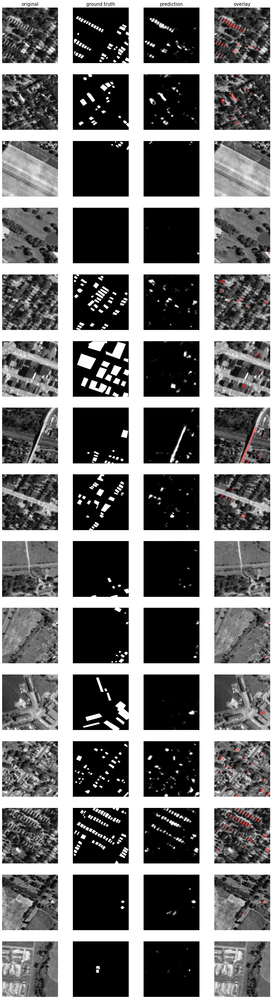

In [31]:
plot_imgs(
    org_imgs=valid_images.reshape(K, N, M, 1), 
    mask_imgs=Yvalid[:, :, :, 1], 
    pred_imgs=Y_valid[:, :, :, 1], 
    nm_img_to_plot=15
  )

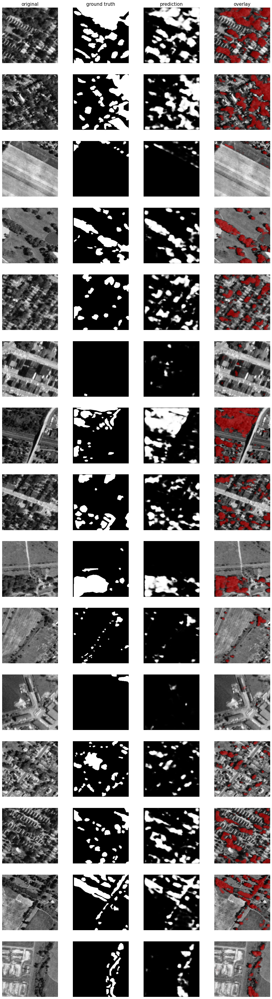

In [32]:
plot_imgs(
    org_imgs=valid_images.reshape(K, N, M, 1), 
    mask_imgs=Yvalid[:, :, :, 0], 
    pred_imgs=Y_valid[:, :, :, 0], 
    nm_img_to_plot=15
  )

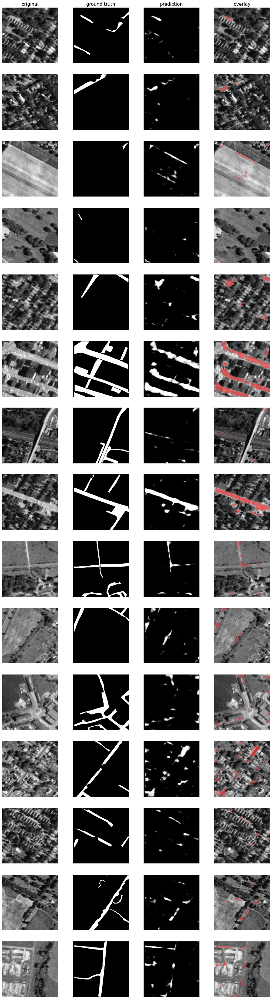

In [70]:
plot_imgs(
    org_imgs=valid_images.reshape(K, N, M, 1), 
    mask_imgs=Yvalid[:, :, :, 2], 
    pred_imgs=Y_valid[:, :, :, 2], 
    nm_img_to_plot=15
  )

In [101]:
Y_valid[0,0,0,0]

0.03359765

In [34]:
treePredict = Y_valid[:,:,:,0]

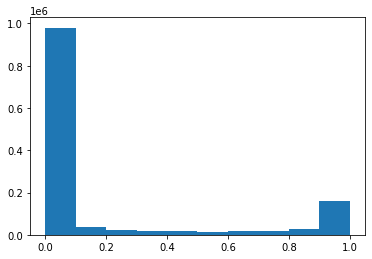

In [35]:
plt.hist(treePredict.flatten())
plt.show()

Driver GTiff supports Create() method.
Driver GTiff supports CreateCopy() method.


In [37]:
r50s = gdal.Open(r'e:\Google Drive\research\projects\utica\A550500171317_ref.tif')

In [110]:
valid_orig = gdal.Open(r'e:\Google Drive\research\projects\utica\mask_50s_valid\u_valid_reproject\wgs_valid_1.tif')

In [112]:
gt = valid_orig.GetGeoTransform()
pt = valid_orig.GetProjection()

In [56]:
# prediction data
base_dirP = Path(r'e:\Google Drive\research\projects\utica\predict50')

In [57]:
J, N, M = 435, 256, 256

In [82]:
predict_img = load_stack_nt((J, N, M), np.float32,base_dirP, "predict")

In [83]:
Y_all = model.predict(predict_img.reshape(J, N, M, 1))

In [18]:
driver = gdal.GetDriverByName("GTiff")

In [87]:
driver.Register()

2

In [113]:
outds = driver.Create(r'e:\Google Drive\research\projects\utica\50s_valid_out\valid_out.tif', xsize=256,ysize=256,
                     bands=1,eType=gdal.GDT_Float32)

In [114]:
outds.SetGeoTransform(gt)

0

In [115]:
outds.SetProjection(pt)

0

In [116]:
outBand = outds.GetRasterBand(1)

In [117]:
outBand.WriteArray(Y_valid[1,:,:,0])

0

In [118]:
outBand.SetNoDataValue(np.nan)

0

In [119]:
outBand.FlushCache()

In [120]:
outBand = None
outds = None

In [ ]:
make_path(img_dir, prefix, i + 1,.tif)

In [ ]:
def load_stack_nt(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape=shape, dtype=dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        stack[i, :, :] = load_image_no_trim(image_path)
    return stack

In [19]:
def save_predict_valid( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(Y_valid[i,:,:,0])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [20]:
tree_valid_dir = r'e:\Google Drive\research\projects\utica\50s_valid_out\trees'
save_predict_valid(nImg = 20,xdim= 256, ydim= 256,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = train_image_dirV , prefix_orig = "wgs_valid")

NameError: name 'Y_valid' is not defined

In [154]:
def save_predict_validB( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        build_ds = gdal.Open(orig_path)
        gt = build_ds.GetGeoTransform()
        pt = build_ds.GetProjection()
        outBuild = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outBuild.SetGeoTransform(gt)
        outBuild.SetProjection(pt)
        outBandBuild = outBuild.GetRasterBand(1)
        outBandBuild.WriteArray(Y_valid[i,:,:,1])
        outBandBuild.SetNoDataValue(np.nan)
        outBandBuild.FlushCache()
        outBandBuild = None
        outBuild = None

In [155]:
build_valid_dir = r'e:\Google Drive\research\projects\utica\50s_valid_out\building'
save_predict_validB(nImg = 20,xdim= 256, ydim= 256,img_dir =build_valid_dir,prefix = "building_predict",orig_dir = train_image_dirV , prefix_orig = "wgs_valid")

In [156]:
def save_predict_validP( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        build_ds = gdal.Open(orig_path)
        gt = build_ds.GetGeoTransform()
        pt = build_ds.GetProjection()
        outPave = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outPave.SetGeoTransform(gt)
        outPave.SetProjection(pt)
        outBandPave = outPave.GetRasterBand(1)
        outBandPave.WriteArray(Y_valid[i,:,:,2])
        outBandPave.SetNoDataValue(np.nan)
        outBandPave.FlushCache()
        outBandPave = None
        outPave = None

In [157]:
pave_valid_dir = r'e:\Google Drive\research\projects\utica\50s_valid_out\pavement'
save_predict_validP(nImg = 20,xdim= 256, ydim= 256,img_dir =pave_valid_dir,prefix = "pavement_predict",orig_dir = train_image_dirV , prefix_orig = "wgs_valid")

In [23]:
#due to late night coding, mask files where slightly off dimensions. Need to resave files that were cut down here for easier matching.
def save_mask_valid( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Yvalid[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [24]:
tree_m_dir = r'e:\Google Drive\research\projects\utica\50s_valid_out\orig\tree'
save_mask_valid(nImg = 20,xdim= 256, ydim= 256,img_dir = tree_m_dir, prefix = "tree_mask",orig_dir = train_image_dirV , prefix_orig = "wgs_valid")

In [197]:
def save_mask_validB( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Yvalid[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [198]:
build_m_dir = r'e:\Google Drive\research\projects\utica\50s_valid_out\orig\building'
save_mask_validB(nImg = 20,xdim= 256, ydim= 256,img_dir = build_m_dir, prefix = "building_mask",orig_dir = train_image_dirV , prefix_orig = "wgs_valid")

In [199]:
def save_mask_validP( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Yvalid[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [201]:
pave_m_dir = r'e:\Google Drive\research\projects\utica\50s_valid_out\orig\pavement'
save_mask_validP(nImg = 20,xdim= 256, ydim= 256,img_dir = pave_m_dir, prefix = "pavement_mask",orig_dir = train_image_dirV , prefix_orig = "wgs_valid")

In [203]:
def save_mask_image( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(valid_images[i, :, :])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [204]:
image_m_dir = r'e:\Google Drive\research\projects\utica\50s_valid_out\orig\image'
save_mask_image(nImg = 20,xdim= 256, ydim= 256,img_dir = image_m_dir, prefix = "image",orig_dir = train_image_dirV , prefix_orig = "wgs_valid")

In [202]:
valid_images.shape

(20, 256, 256)

In [208]:
train_image_dirV

WindowsPath('e:/Google Drive/research/projects/utica/mask_50s_valid/u_valid_reproject')

In [212]:
# save map prediction

def save_predict_build( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None


In [215]:
predict_build_dir = r'e:\Google Drive\research\projects\utica\50s_predict_out\building'
save_predict_build(nImg = 435,xdim= 256, ydim= 256,img_dir = predict_build_dir, prefix = "building",orig_dir = base_dirP , prefix_orig = "predict")

In [216]:
def save_predict_tree( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [217]:
predict_tree_dir = r'e:\Google Drive\research\projects\utica\50s_predict_out\tree'
save_predict_tree(nImg = 435,xdim= 256, ydim= 256,img_dir = predict_tree_dir, prefix = "tree",orig_dir = base_dirP , prefix_orig = "predict")

In [218]:
def save_predict_pave( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [221]:
predict_pave_dir = r'e:\Google Drive\research\projects\utica\50s_predict_out\pavement'
save_predict_pave(nImg = 435,xdim= 256, ydim= 256,img_dir = predict_pave_dir, prefix = "pavement",orig_dir = base_dirP , prefix_orig = "predict")